In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import h5py
from google.colab import drive
from glob import glob
from time import time

from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model 
from tensorflow.keras.optimizers import Adam

In [ ]:
def encoder_block(x, n_filters_in, n_filters_out, n_convs=1, activation="relu", batchNorm=False):
    x_in = x
    for _ in range(n_convs):
        x = layers.Conv2D(n_filters_in, (3, 3), activation=activation, padding="same")(x)
        if batchNorm:
            x = layers.BatchNormalization()(x)
    
    if x_in.shape[-1] != x.shape[-1]:
            x_in = layers.Conv2D(n_filters_in, (1, 1), padding="same")(x_in)
    x = layers.Add()([x, x_in])

    y = layers.Conv2D(n_filters_out, (3, 3), strides=2, activation=activation, padding="same")(x)
    if batchNorm:
            y = layers.BatchNormalization()(y)
    x = layers.Conv2D(n_filters_out, (1, 1), strides=2, padding="same")(x)
    x_out = layers.Add()([y, x])
    return x_out

def decoder_block(x, n_filters_in, n_filters_out, n_convst=0, activation="relu", batchNorm=False):
    x_in = x

    x = layers.Conv2DTranspose(n_filters_out, (3, 3), strides=2, activation=activation, padding="same")(x)
    if batchNorm:
            x = layers.BatchNormalization()(x)

    x_in = layers.Conv2DTranspose(n_filters_out, (1, 1), strides=2, padding="same")(x_in)
    x = layers.Add()([x, x_in])
    y = x
    for _ in range(n_convst):
        y = layers.Conv2DTranspose(n_filters_out, (3, 3), activation=activation, padding="same")(y)
        if batchNorm:
            y = layers.BatchNormalization()(y)
    if n_convst > 0:
        x = layers.Add()([x, y])

    return x

In [ ]:
latent_dim = 64

### Making of the encoder

n_filters = [16, 32, 64, 128, latent_dim]

encoder_input = layers.Input(shape=(256, 256, 13))

for i in range(len(n_filters) - 1):
    if i == 0:
        x = encoder_block(encoder_input, n_filters[i], n_filters[i + 1], batchNorm=True)
    else:
        x = encoder_block(x, n_filters[i], n_filters[i + 1], batchNorm=True)

encoder = Model(encoder_input, x)

### Making of the decoder

n_filters = [latent_dim, 64, 32, 32, 16]

decoder_input = x

for i in range(len(n_filters) - 1):
    if i == 0:
        x = decoder_block(decoder_input, n_filters[i], n_filters[i + 1], n_convst=1, batchNorm=False)
    else:
        x = decoder_block(x, n_filters[i], n_filters[i + 1], n_convst=1, batchNorm=False)

x = layers.Conv2D(13, (3, 3), padding="same")(x)

decoder = Model(decoder_input, x)

### Making of the autoencoder

autoencoder = Model(encoder_input, x)
autoencoder.compile(optimizer=Adam(learning_rate=3e-4), loss="mse")

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
sentinel_path = '/content/drive/My Drive/2017_256/'
h5_files = glob(sentinel_path + '*.h5')

In [ ]:
with h5py.File('complete.h5',mode='w') as h5fw:
    for i, h5name in enumerate(h5_files):
        start = time()
        h5fr = h5py.File(h5name,'r') 
        data = h5fr['data'][:]
        if i == 0:
            h5fw.create_dataset('data', data=data, maxshape=(None, 256, 256, 13))
        else:
            h5fw['data'].resize((h5fw['data'].shape[0] + data.shape[0]), axis = 0)
            h5fw['data'][-data.shape[0]:] = data

        h5fr.close()     

In [ ]:
class Sampler:
    mean = np.array([1760.05905547, 1656.2374742 , 1810.36448373, 2438.49436954,
       2556.47042701, 2876.79443434, 3165.31554056, 2995.23723349,
       3407.94282626,  775.14546495,   20.60749623, 3919.13481428,
       2938.35861981])
    
    std = np.array([ 723.10965756,  785.59461309,  835.9313834 , 1064.44026277,
       1045.3049899 , 1057.90164703, 1123.31538591, 1060.01203872,
       1167.78468906,  433.82170561,   22.23551899, 1295.95783439,
       1075.76407614])
    
    def __init__(self, block_size, n_blocks, path, data_size=10548):
        self.block_size = block_size
        self.stamps = np.linspace(start=0, stop=data_size, num=n_blocks + 1, dtype='int32')
        self.path = path

    def sample(self):
        offsets = np.random.randint(np.diff(self.stamps) - self.block_size)
        starting_points = self.stamps[:-1] + offsets
        data = []
        with h5py.File('complete.h5',mode='r') as f:
            for s in starting_points:
                data.append(f['data'][s:s+self.block_size])
        data = np.vstack(data)
        np.random.shuffle(data)
        data = (data - Sampler.mean)/Sampler.std
        return data

In [ ]:
block_size = 1
n_blocks = 160
split = int(0.8 * n_blocks)
sampler = Sampler(block_size, n_blocks, 'complete.h5')
loss = []
val_loss = []

In [ ]:
for _ in range(20):
    X = sampler.sample()
    X_train, X_val = X[:-split], X[-split:]
    history = autoencoder.fit(x=X_train, y=X_train, epochs=5, batch_size=32, shuffle=True, validation_data=(X_val, X_val))
    loss += history.history['loss']
    val_loss += history.history['val_loss']
    del X_train
    del X_val
    del X

Epoch 1/5
1/1 [==============================] - 5s 5s/step - loss: 6.0014 - val_loss: 4.6483
Epoch 2/5
1/1 [==============================] - 1s 978ms/step - loss: 4.2671 - val_loss: 3.4025
Epoch 3/5
1/1 [==============================] - 1s 982ms/step - loss: 3.4925 - val_loss: 2.7955
Epoch 4/5
1/1 [==============================] - 1s 964ms/step - loss: 3.0485 - val_loss: 2.4179
Epoch 5/5
1/1 [==============================] - 1s 990ms/step - loss: 2.7529 - val_loss: 2.1592
Epoch 1/5
1/1 [==============================] - 2s 2s/step - loss: 1.9268 - val_loss: 1.6953
Epoch 2/5
1/1 [==============================] - 1s 1s/step - loss: 1.7545 - val_loss: 1.5986
Epoch 3/5
1/1 [==============================] - 1s 966ms/step - loss: 1.6241 - val_loss: 1.5396
Epoch 4/5
1/1 [==============================] - 1s 991ms/step - loss: 1.5272 - val_loss: 1.5088
Epoch 5/5
1/1 [==============================] - 1s 972ms/step - loss: 1.4534 - val_loss: 1.4967
Epoch 1/5
1/1 [========================

KeyboardInterrupt: ignored

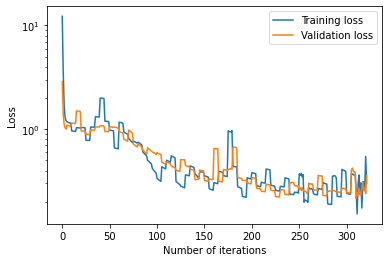

In [ ]:
fig, ax = plt.subplots()
ax.plot(loss)
ax.plot(val_loss)
ax.set_yscale("log")
ax.set_xlabel('Number of iterations')
ax.set_ylabel('Loss');
ax.legend(['Training loss', 'Validation loss']);

fig.savefig('loss_autoencoder_64.pdf', format='pdf')

In [ ]:
X = Sampler(1, 32, 'complete.h5').sample()
im = X
im = im * Sampler.std + Sampler.mean

In [ ]:
im_fake = decoder.predict(encoder.predict(X))
im_fake = im_fake * Sampler.std + Sampler.mean

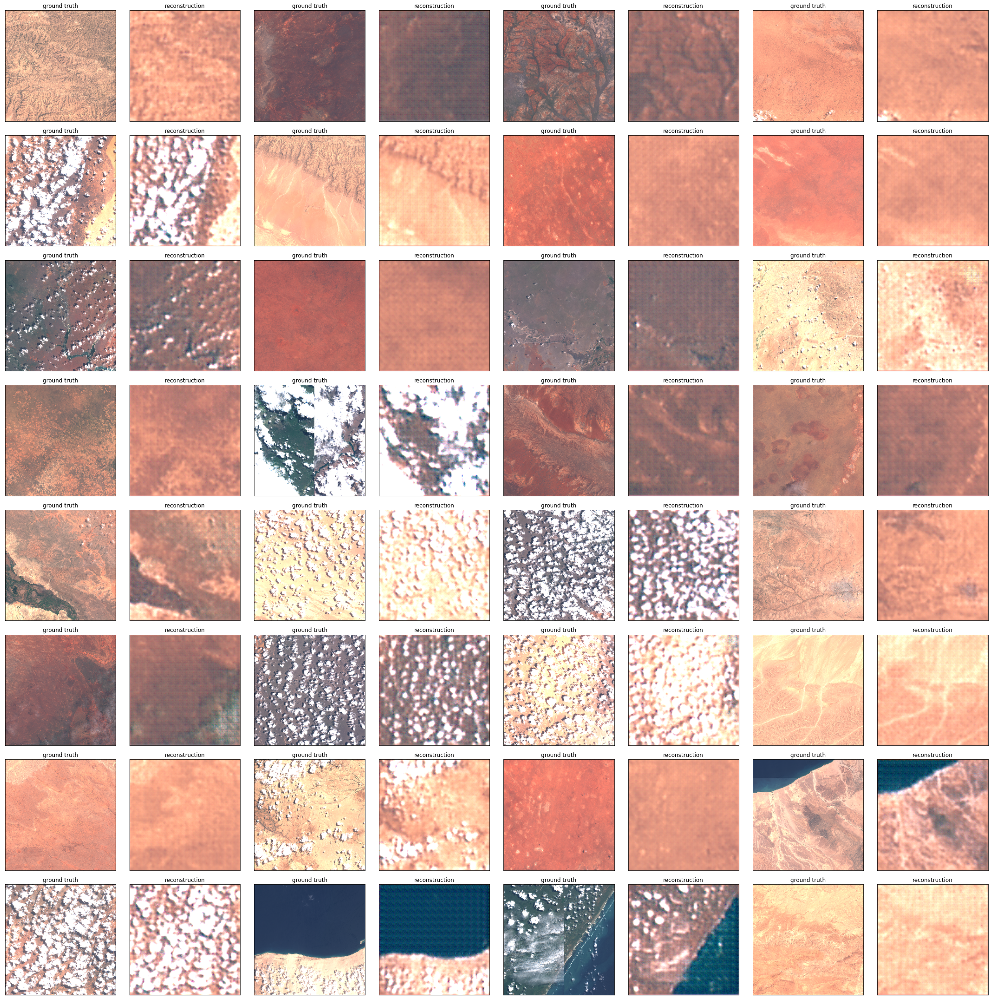

In [ ]:
fig, axs = plt.subplots(ncols=8, nrows=8, figsize=(30, 30))
axs = axs.flatten()
for i in range(0, len(axs), 2):
    axs[i].imshow(np.clip(im[i//2][..., [3, 2, 1]] * 3.5 / 10000, 0, 1))
    axs[i+1].imshow(np.clip(im_fake[i//2][..., [3, 2, 1]] * 3.5 / 10000, 0, 1));
    axs[i].axes.get_xaxis().set_visible(False)
    axs[i+1].axes.get_xaxis().set_visible(False)
    axs[i].axes.get_yaxis().set_visible(False)
    axs[i+1].axes.get_yaxis().set_visible(False)
    axs[i].set_title('ground truth')
    axs[i+1].set_title('reconstruction')
plt.tight_layout()
fig.savefig("ground_truth_vs_reconstruction_64.pdf", format="pdf")


In [ ]:
encoder.save('trained_encoder_64')


INFO:tensorflow:Assets written to: trained_encoder_64/assets


In [ ]:
!zip -r /content/trained_encoder_64.zip /content/trained_encoder_64

  adding: content/trained_encoder_64/ (stored 0%)
  adding: content/trained_encoder_64/saved_model.pb (deflated 91%)
  adding: content/trained_encoder_64/variables/ (stored 0%)
  adding: content/trained_encoder_64/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: content/trained_encoder_64/variables/variables.index (deflated 66%)
  adding: content/trained_encoder_64/keras_metadata.pb (deflated 95%)
  adding: content/trained_encoder_64/assets/ (stored 0%)


In [ ]:
decoder.save('trained_decoder_64')

INFO:tensorflow:Assets written to: trained_decoder_64/assets


In [ ]:
!zip -r /content/trained_decoder_64.zip /content/trained_decoder_64

  adding: content/trained_decoder_64/ (stored 0%)
  adding: content/trained_decoder_64/saved_model.pb (deflated 92%)
  adding: content/trained_decoder_64/variables/ (stored 0%)
  adding: content/trained_decoder_64/variables/variables.data-00000-of-00001 (deflated 10%)
  adding: content/trained_decoder_64/variables/variables.index (deflated 68%)
  adding: content/trained_decoder_64/keras_metadata.pb (deflated 95%)
  adding: content/trained_decoder_64/assets/ (stored 0%)
